In [3]:
brazilMapsLink="https://github.com/CienciaDeDatosEspacial/code_and_data/raw/main/maps/brazilMaps_5641.gpkg"

from  fiona import listlayers


#layers in maps
listlayers(brazilMapsLink)

['country',
 'cities',
 'rivers',
 'border',
 'states',
 'municipalities',
 'airports']

In [2]:
import os
os.environ['USE_PYGEOS'] = '0'

import geopandas as gpd

states=gpd.read_file(brazilMapsLink,layer='states')
municipalities=gpd.read_file(brazilMapsLink,layer='municipalities')
airports=gpd.read_file(brazilMapsLink,layer='airports')
rivers=gpd.read_file(brazilMapsLink,layer='rivers')
border=gpd.read_file(brazilMapsLink,layer='border')

In [6]:
rivers

,NAME,SYSTEM,geometry
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2..."
1,Paraguay,Parana,"LINESTRING (3835020.714 8129825.454, 3741785.7..."
2,"Rio Grande, South America",Parana,"LINESTRING (4847414.941 7485403.427, 4904215.7..."
3,Rio Paranaiba,Parana,"LINESTRING (4663725.681 7856927.247, 4651734.8..."
4,Madre de Dios,Amazon,"LINESTRING (2503340.116 8833866.152, 2541060.6..."
5,Guapore,Amazon,"MULTILINESTRING ((2541060.695 8858215.442, 253..."
6,Araguaia,NaN,"LINESTRING (3905017.583 7982502.448, 3886630.3..."
7,Rio Juruena,Amazon,"LINESTRING (3247949.959 8371569.076, 3326166.4..."
8,Rio Teles Pires,Amazon,"LINESTRING (3662673.786 8372171.932, 3703620.0..."
9,Tocantins,NaN,"MULTILINESTRING ((4387427.882 9414376.665, 433..."


In [8]:
rivers.SYSTEM.value_counts()

Amazon    13
Parana     4
Name: SYSTEM, dtype: int64

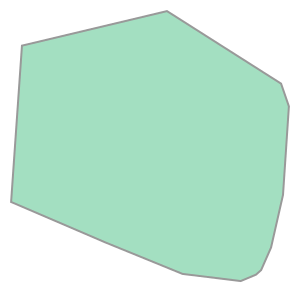

In [12]:
Amazon=rivers[rivers.SYSTEM=='Amazon']
Amazon.unary_union.convex_hull

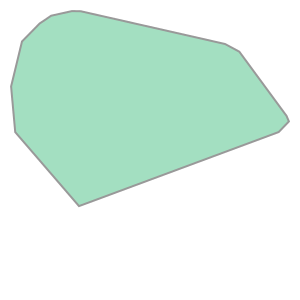

In [36]:
Parana=rivers[rivers.SYSTEM=='Parana']
Parana.unary_union.convex_hull

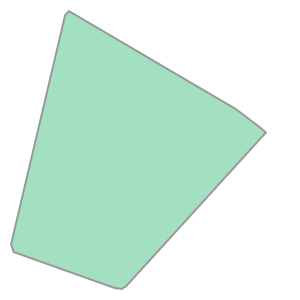

In [45]:
SanFranTocAra=rivers[rivers.NAME.isin(['San Francisco','Tocantins','Araguaia'])]
SanFranTocAra.unary_union.convex_hull

In [46]:
# as gdf
Amazon_hull=gpd.GeoSeries(Amazon.unary_union.convex_hull).to_frame()
Amazon_hull.rename(columns={0:'geometry'},inplace=True)
Amazon_hull['name']='Amazon hull' # optional
Amazon_hull=Amazon_hull.set_geometry('geometry')
Amazon_hull.crs="EPSG:5641"

Parana_hull=gpd.GeoSeries(Parana.unary_union.convex_hull).to_frame()
Parana_hull.rename(columns={0:'geometry'},inplace=True)
Parana_hull['name']='Parana hull' # optional
Parana_hull=Parana_hull.set_geometry('geometry')
Parana_hull.crs="EPSG:5641"


SanFranTocAra_hull=gpd.GeoSeries(SanFranTocAra.unary_union.convex_hull).to_frame()
SanFranTocAra_hull.rename(columns={0:'geometry'},inplace=True)
SanFranTocAra_hull['name']='SanFrancisco, Tocantins and Araguai hull' # optional
SanFranTocAra_hull=SanFranTocAra_hull.set_geometry('geometry')
SanFranTocAra_hull.crs="EPSG:5641"


<Axes: >

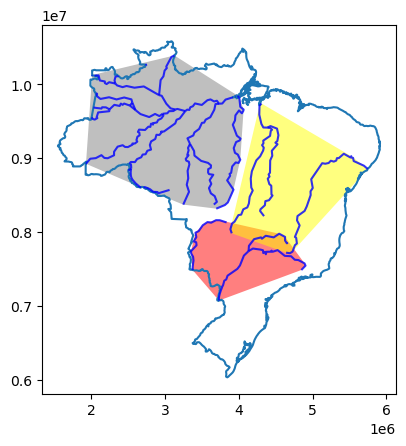

In [51]:
base=border.plot()
Amazon_hull.plot(ax=base,facecolor='grey', alpha=0.5)
Parana_hull.plot(ax=base,facecolor='red', alpha=0.5)
SanFranTocAra_hull.plot(ax=base,facecolor='yellow', alpha=0.5)
rivers.plot(ax=base,edgecolor='blue', alpha=0.8)


## Overlay

In [53]:
Parana_hull.overlay(SanFranTocAra_hull, how="union")

,name_1,name_2,geometry
0,Parana hull,"SanFrancisco, Tocantins and Araguai hull","POLYGON ((4547516.636 7977030.959, 4627289.827..."
1,Parana hull,NaN,"POLYGON ((3375860.234 7484861.042, 3355454.699..."
2,NaN,"SanFrancisco, Tocantins and Araguai hull","POLYGON ((4280892.456 9711114.259, 4308107.943..."


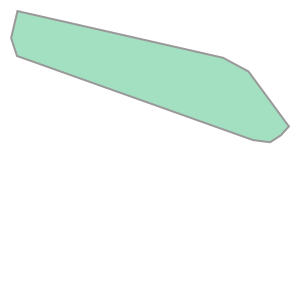

In [62]:
Parana_hull.overlay(SanFranTocAra_hull, how="union").iloc[0,:].geometry

<Axes: >

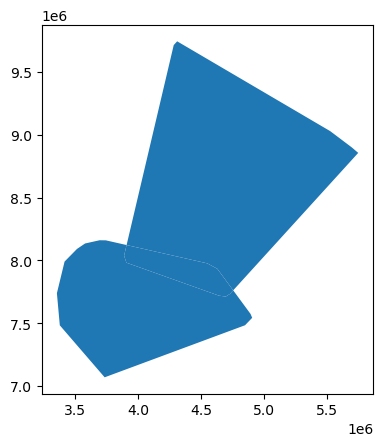

In [61]:
Parana_hull.overlay(SanFranTocAra_hull, how="union").plot()

In [64]:
Parana_hull.overlay(SanFranTocAra_hull, how="intersection")

,name_1,name_2,geometry
0,Parana hull,"SanFrancisco, Tocantins and Araguai hull","POLYGON ((4547516.636 7977030.959, 4627289.827..."


<Axes: >

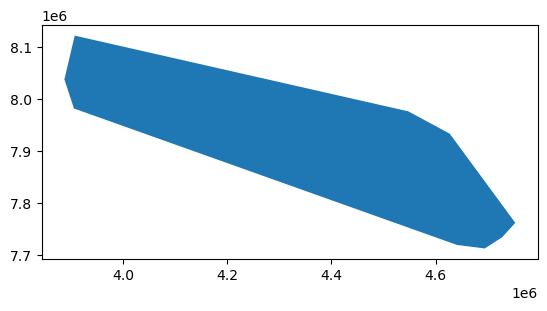

In [65]:
Parana_hull.overlay(SanFranTocAra_hull, how="intersection").plot()

In [66]:
Parana_hull.overlay(SanFranTocAra_hull, how="symmetric_difference")

,name_1,name_2,geometry
0,Parana hull,NaN,"POLYGON ((3375860.234 7484861.042, 3355454.699..."
1,NaN,"SanFrancisco, Tocantins and Araguai hull","POLYGON ((4280892.456 9711114.259, 4308107.943..."


<Axes: >

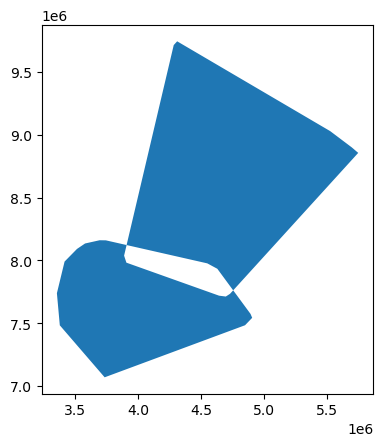

In [67]:
Parana_hull.overlay(SanFranTocAra_hull, how="symmetric_difference").plot()

<Axes: >

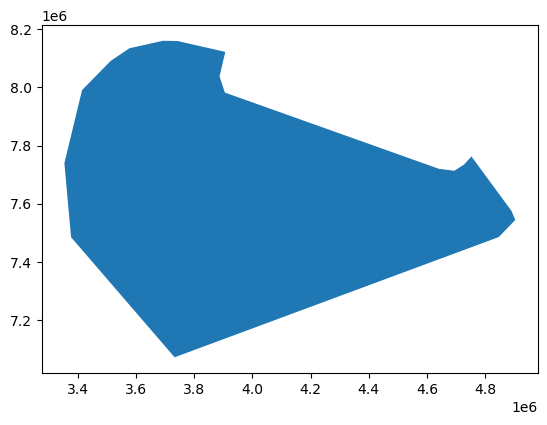

In [68]:
Parana_hull.overlay(SanFranTocAra_hull, how="difference").plot()

<Axes: >

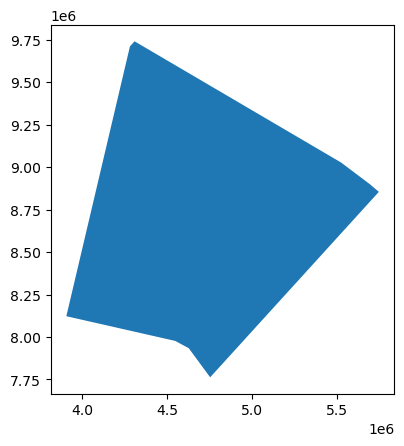

In [69]:
SanFranTocAra_hull.overlay(Parana_hull, how="difference").plot()

<Axes: >

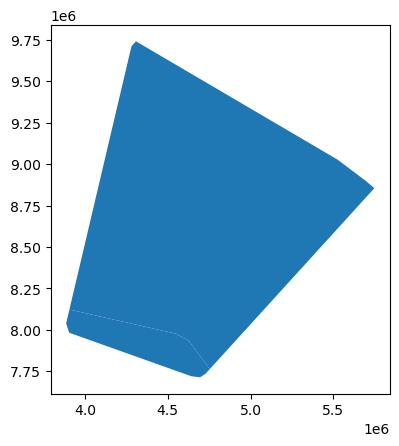

In [70]:
SanFranTocAra_hull.overlay(Parana_hull, how="identity").plot()

## Buffer

<Axes: >

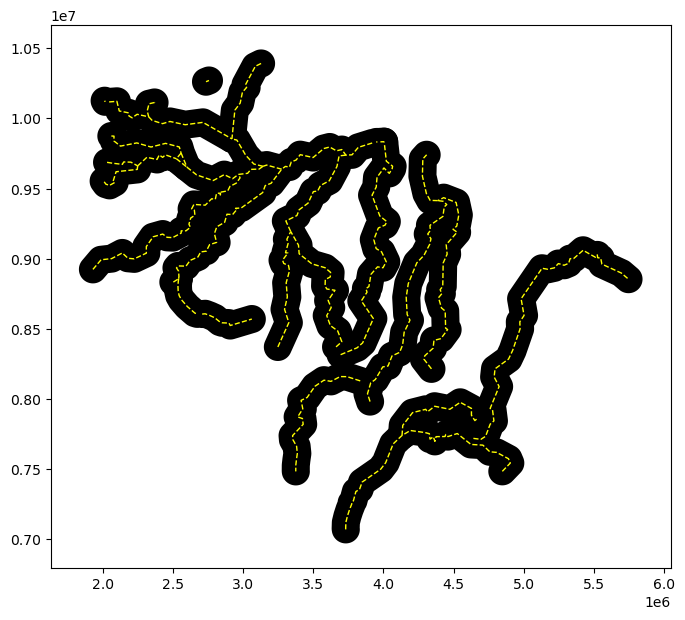

In [89]:
rivers_buf = rivers.buffer(distance = 100000)
base = rivers_buf.plot(facecolor='black',figsize=(8,8))
rivers.plot(ax=base, color='yellow', linestyle='dashed',linewidth=1)


In [90]:
type(rivers_buf)

geopandas.geoseries.GeoSeries

In [91]:
rivers_buf.to_frame()

,0
0,"POLYGON ((3632043.626 7064945.464, 3631261.612..."
1,"POLYGON ((3299306.229 7829032.139, 3296528.416..."
2,"POLYGON ((4244133.993 7668085.102, 4212711.255..."
3,"POLYGON ((4275035.857 7817540.133, 4265936.199..."
4,"POLYGON ((2486826.886 8942231.475, 2495323.048..."
5,"POLYGON ((2638440.481 8831193.093, 2636080.548..."
6,"POLYGON ((3791640.854 8007123.971, 3788976.284..."
7,"POLYGON ((3202950.333 9052392.593, 3204047.234..."
8,"POLYGON ((3486617.622 8860625.998, 3462882.310..."
9,"POLYGON ((4209639.929 8223742.878, 4203852.651..."


In [92]:
rivers_bufDF=rivers_buf.to_frame()
rivers_bufDF.rename(columns={0:'geometry'},inplace=True)
rivers_bufDF = rivers_bufDF.set_geometry("geometry")
rivers_bufDF

,geometry
0,"POLYGON ((3632043.626 7064945.464, 3631261.612..."
1,"POLYGON ((3299306.229 7829032.139, 3296528.416..."
2,"POLYGON ((4244133.993 7668085.102, 4212711.255..."
3,"POLYGON ((4275035.857 7817540.133, 4265936.199..."
4,"POLYGON ((2486826.886 8942231.475, 2495323.048..."
5,"POLYGON ((2638440.481 8831193.093, 2636080.548..."
6,"POLYGON ((3791640.854 8007123.971, 3788976.284..."
7,"POLYGON ((3202950.333 9052392.593, 3204047.234..."
8,"POLYGON ((3486617.622 8860625.998, 3462882.310..."
9,"POLYGON ((4209639.929 8223742.878, 4203852.651..."


In [93]:
rivers_bufDF.crs

<Derived Projected CRS: EPSG:5641>
Name: SIRGAS 2000 / Brazil Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Brazil - offshore - equatorial margin.
- bounds: (-51.64, -5.74, -32.43, 7.04)
Coordinate Operation:
- name: Petrobras Mercator
- method: Mercator (variant B)
Datum: Sistema de Referencia Geocentrico para las AmericaS 2000
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<Axes: >

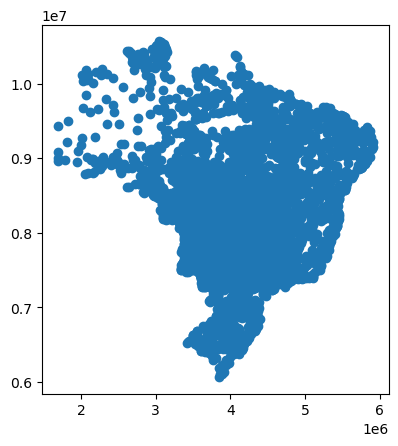

In [99]:
small_airports=airports[airports.kind=='small_airport']
small_airports.plot()

<Axes: >

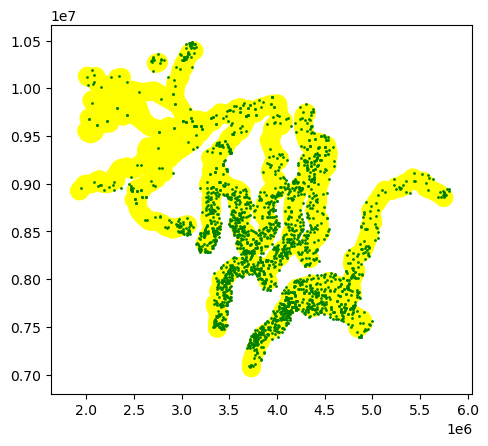

In [108]:
base=rivers_bufDF.plot(color='yellow')
small_airports.overlay(rivers_bufDF, how="intersection").plot(ax=base, color='green', markersize=1)

## Spatial join

In [179]:
states.head()

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,geometry
0,Brazil,Brasil,BR,Acre,BR12,"MULTIPOLYGON (((2121076.536 8774544.241, 21207..."
1,Brazil,Brasil,BR,Alagoas,BR27,"POLYGON ((5838488.634 9020878.756, 5838332.881..."
2,Brazil,Brasil,BR,Amapá,BR16,"MULTIPOLYGON (((4169895.790 10233371.212, 4170..."
3,Brazil,Brasil,BR,Amazonas,BR13,"MULTIPOLYGON (((3276296.419 9906952.881, 32767..."
4,Brazil,Brasil,BR,Bahia,BR29,"MULTIPOLYGON (((5477620.095 7981004.282, 54774..."


In [176]:
# parts of the states that intersect with the hull
SanFranTocAra_hull.overlay(states,how='intersection')

,name,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,geometry
0,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Alagoas,BR27,"POLYGON ((5695434.891 8898340.970, 5746115.246..."
1,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Bahia,BR29,"MULTIPOLYGON (((4626563.539 8689353.415, 46267..."
2,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Distrito Federal,BR53,"POLYGON ((4512959.571 8221446.674, 4512959.571..."
3,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Goiás,BR52,"MULTIPOLYGON (((3905017.583 7982502.448, 38866..."
4,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Maranhão,BR21,"MULTIPOLYGON (((4551056.718 9003504.913, 45514..."
5,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Mato Grosso,BR51,"POLYGON ((4092932.408 8913657.440, 4099517.692..."
6,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Minas Gerais,BR31,"MULTIPOLYGON (((4523710.944 8078141.731, 45237..."
7,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Pará,BR15,"POLYGON ((4280892.456 9711114.259, 4308107.943..."
8,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Pernambuco,BR26,"POLYGON ((5524075.102 9027468.732, 5566540.138..."
9,"SanFrancisco, Tocantins and Araguai hull",Brazil,Brasil,BR,Piauí,BR22,"POLYGON ((5266846.328 9178439.062, 5262603.101..."


<Axes: >

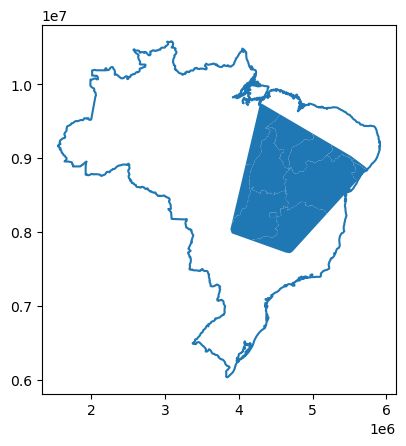

In [166]:
base=border.plot()
states.overlay(SanFranTocAra_hull,how='intersection').plot(ax=base)

<Axes: >

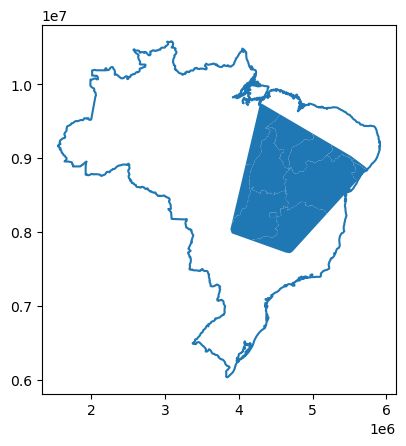

In [167]:
base=border.plot()
SanFranTocAra_hull.overlay(states,how='intersection').plot(ax=base)

In [188]:
municipalities

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry
0,Brazil,Brasil,BR,Rondônia,BR11,Alta Floresta D'Oeste,BR1100015,0,"POLYGON ((2880702.575 8678970.180, 2881137.154..."
1,Brazil,Brasil,BR,Rondônia,BR11,Ariquemes,BR1100023,1,"POLYGON ((2839173.154 8911097.984, 2838718.204..."
2,Brazil,Brasil,BR,Rondônia,BR11,Cabixi,BR1100031,2,"POLYGON ((3067184.343 8504324.153, 3067191.133..."
3,Brazil,Brasil,BR,Rondônia,BR11,Cacoal,BR1100049,3,"POLYGON ((2997393.730 8777661.276, 2997393.730..."
4,Brazil,Brasil,BR,Rondônia,BR11,Cerejeiras,BR1100056,4,"POLYGON ((2974496.868 8540812.592, 2974897.495..."
...,...,...,...,...,...,...,...,...,...
5567,Brazil,Brasil,BR,Goiás,BR52,Vianópolis,BR5222005,5567,"POLYGON ((4414833.073 8123005.730, 4414826.282..."
5568,Brazil,Brasil,BR,Goiás,BR52,Vicentinópolis,BR5222054,5568,"MULTIPOLYGON (((4227475.357 8023245.907, 42270..."
5569,Brazil,Brasil,BR,Goiás,BR52,Vila Boa,BR5222203,5569,"POLYGON ((4542830.062 8359934.818, 4543400.447..."
5570,Brazil,Brasil,BR,Goiás,BR52,Vila Propício,BR5222302,5570,"POLYGON ((4375754.947 8322581.505, 4376087.671..."


In [185]:
municipalities.ADM1_PT.value_counts().sort_index()

Acre                    22
Alagoas                102
Amapá                   16
Amazonas                62
Bahia                  417
Ceará                  184
Distrito Federal         1
Espírito Santo          78
Goiás                  246
Maranhão               217
Mato Grosso            141
Mato Grosso do Sul      79
Minas Gerais           853
Paraná                 399
Paraíba                223
Pará                   144
Pernambuco             185
Piauí                  224
Rio Grande do Norte    167
Rio Grande do Sul      499
Rio de Janeiro          92
Rondônia                52
Roraima                 15
Santa Catarina         295
Sergipe                 75
São Paulo              645
Tocantins              139
Name: ADM1_PT, dtype: int64

<Axes: >

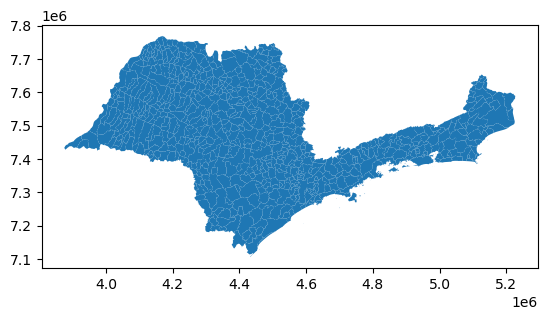

In [190]:
municipalities[municipalities.ADM1_PT.isin(['Rio de Janeiro','São Paulo'])].plot()

In [194]:
BigOnes=municipalities[municipalities.ADM1_PT.isin(['Rio de Janeiro','São Paulo'])]
BigOnes.shape

(737, 9)

In [231]:
# the municipalities that touch the rivers
BigOnes.sjoin(rivers,how="inner", predicate='intersects').shape

(33, 12)

In [237]:
# left is polygon, right is a line...result:
BigOnes.sjoin(rivers,how="inner", predicate='intersects').geometry

3300    POLYGON ((4469427.014 7732854.745, 4469528.868...
3329    POLYGON ((4386965.717 7707861.718, 4387053.991...
3402    POLYGON ((4371802.997 7723228.413, 4372047.448...
3465    POLYGON ((4411566.943 7719035.519, 4412110.166...
3470    POLYGON ((4345117.153 7691451.823, 4345538.151...
3496    POLYGON ((4493892.433 7743682.788, 4494449.237...
3600    POLYGON ((4157297.697 7749600.656, 4157467.454...
3601    POLYGON ((4421134.463 7737727.081, 4421344.962...
3658    POLYGON ((4183732.301 7758280.097, 4183908.848...
3718    POLYGON ((4170701.732 7768110.423, 4170226.412...
3756    POLYGON ((4518222.047 7729311.064, 4517543.018...
3779    POLYGON ((4148986.381 7742411.346, 4148979.590...
3369    POLYGON ((4014382.438 7556180.340, 4014470.711...
3392    POLYGON ((4060407.032 7664034.874, 4060787.288...
3501    POLYGON ((4105711.855 7699194.204, 4104808.746...
3530    POLYGON ((4071855.463 7662476.398, 4071536.319...
3589    POLYGON ((4008400.191 7505278.337, 4008719.335...
3620    POLYGO

In [239]:
BigOnes.sjoin(rivers,how="inner", predicate='intersects').geometry.duplicated()

3300    False
3329    False
3402    False
3465    False
3470    False
3496    False
3600    False
3601    False
3658    False
3718    False
3756    False
3779    False
3369    False
3392    False
3501    False
3530    False
3589    False
3620    False
3641    False
3659    False
3665    False
3730    False
3732    False
3763    False
3766    False
3779     True
3782    False
3788    False
3793    False
3796    False
3818    False
3873    False
3779     True
Name: geometry, dtype: bool

In [306]:
Which=BigOnes.sjoin(rivers,how="inner", predicate='intersects').geometry.duplicated()
positionsDuplicates=Which[Which==True].drop_duplicates().index.to_list()
positionsDuplicates

[3779]

In [307]:
BigOnes.sjoin(rivers,how="inner", predicate='intersects')

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry,index_right,NAME,SYSTEM
3300,Brazil,Brasil,BR,São Paulo,BR35,Aramina,BR3503000,3300,"POLYGON ((4469427.014 7732854.745, 4469528.868...",2,"Rio Grande, South America",Parana
3329,Brazil,Brasil,BR,São Paulo,BR35,Barretos,BR3505500,3329,"POLYGON ((4386965.717 7707861.718, 4387053.991...",2,"Rio Grande, South America",Parana
3402,Brazil,Brasil,BR,São Paulo,BR35,Colômbia,BR3512100,3402,"POLYGON ((4371802.997 7723228.413, 4372047.448...",2,"Rio Grande, South America",Parana
3465,Brazil,Brasil,BR,São Paulo,BR35,Guaíra,BR3517406,3465,"POLYGON ((4411566.943 7719035.519, 4412110.166...",2,"Rio Grande, South America",Parana
3470,Brazil,Brasil,BR,São Paulo,BR35,Guaraci,BR3517901,3470,"POLYGON ((4345117.153 7691451.823, 4345538.151...",2,"Rio Grande, South America",Parana
3496,Brazil,Brasil,BR,São Paulo,BR35,Igarapava,BR3520103,3496,"POLYGON ((4493892.433 7743682.788, 4494449.237...",2,"Rio Grande, South America",Parana
3600,Brazil,Brasil,BR,São Paulo,BR35,Mesópolis,BR3529658,3600,"POLYGON ((4157297.697 7749600.656, 4157467.454...",2,"Rio Grande, South America",Parana
3601,Brazil,Brasil,BR,São Paulo,BR35,Miguelópolis,BR3529708,3601,"POLYGON ((4421134.463 7737727.081, 4421344.962...",2,"Rio Grande, South America",Parana
3658,Brazil,Brasil,BR,São Paulo,BR35,Ouroeste,BR3534757,3658,"POLYGON ((4183732.301 7758280.097, 4183908.848...",2,"Rio Grande, South America",Parana
3718,Brazil,Brasil,BR,São Paulo,BR35,Populina,BR3540408,3718,"POLYGON ((4170701.732 7768110.423, 4170226.412...",2,"Rio Grande, South America",Parana


In [312]:
# see previous result 
m=BigOnes.explore(color='lightgrey')
m=BigOnes.sjoin(rivers,how="inner", predicate='intersects').explore(m=m)
m=BigOnes.loc[positionsDuplicates,:].explore(m=m,color='red')
rivers.explore(color='blue',m=m)

In [234]:
# the rivers that touch the municipalities
rivers.sjoin(BigOnes,how="inner", predicate='intersects').shape

(33, 12)

In [235]:
# left is line, right is a polygon...result:
rivers.sjoin(BigOnes,how="inner", predicate='intersects').geometry

0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINESTRING (3732042.147 7071744.412, 3731126.2...
0    LINES

In [252]:
rivers.sjoin(BigOnes,how="inner", predicate='intersects').geometry.duplicated()

0    False
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
0     True
2    False
3    False
2     True
2     True
2     True
2     True
2     True
2     True
2     True
2     True
2     True
2     True
2     True
Name: geometry, dtype: bool

In [253]:
rivers.sjoin(BigOnes,how="inner", predicate='intersects')

,NAME,SYSTEM,geometry,index_right,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3763,Brazil,Brasil,BR,São Paulo,BR35,Rosana,BR3544251,3763
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3873,Brazil,Brasil,BR,São Paulo,BR35,Teodoro Sampaio,BR3554300,3873
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3589,Brazil,Brasil,BR,São Paulo,BR35,Marabá Paulista,BR3528700,3589
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3730,Brazil,Brasil,BR,São Paulo,BR35,Presidente Epitácio,BR3541307,3730
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3369,Brazil,Brasil,BR,São Paulo,BR35,Caiuá,BR3509106,3369
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3732,Brazil,Brasil,BR,São Paulo,BR35,Presidente Venceslau,BR3541505,3732
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3659,Brazil,Brasil,BR,São Paulo,BR35,Ouro Verde,BR3534807,3659
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3665,Brazil,Brasil,BR,São Paulo,BR35,Panorama,BR3535408,3665
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3793,Brazil,Brasil,BR,São Paulo,BR35,Santa Mercedes,BR3547106,3793
0,Parana,Parana,"LINESTRING (3732042.147 7071744.412, 3731126.2...",3620,Brazil,Brasil,BR,São Paulo,BR35,Monte Castelo,BR3531605,3620


In [224]:
BigOnes.sjoin(rivers,how="inner", predicate='contains')

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry,index_right,NAME,SYSTEM


In [225]:
BigOnes.sjoin(rivers,how="inner", predicate='touches')

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry,index_right,NAME,SYSTEM


In [227]:
BigOnes.sjoin(rivers,how="inner", predicate='overlaps')

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry,index_right,NAME,SYSTEM


In [228]:
BigOnes.sjoin(rivers,how="inner", predicate='within')

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry,index_right,NAME,SYSTEM


In [229]:
BigOnes.sjoin(rivers,how="inner", predicate='crosses')

,ADM0_EN,ADM0_PT,ADM0_PCODE,ADM1_PT,ADM1_PCODE,ADM2_PT,ADM2_PCODE,ET_ID,geometry,index_right,NAME,SYSTEM
3300,Brazil,Brasil,BR,São Paulo,BR35,Aramina,BR3503000,3300,"POLYGON ((4469427.014 7732854.745, 4469528.868...",2,"Rio Grande, South America",Parana
3329,Brazil,Brasil,BR,São Paulo,BR35,Barretos,BR3505500,3329,"POLYGON ((4386965.717 7707861.718, 4387053.991...",2,"Rio Grande, South America",Parana
3402,Brazil,Brasil,BR,São Paulo,BR35,Colômbia,BR3512100,3402,"POLYGON ((4371802.997 7723228.413, 4372047.448...",2,"Rio Grande, South America",Parana
3465,Brazil,Brasil,BR,São Paulo,BR35,Guaíra,BR3517406,3465,"POLYGON ((4411566.943 7719035.519, 4412110.166...",2,"Rio Grande, South America",Parana
3470,Brazil,Brasil,BR,São Paulo,BR35,Guaraci,BR3517901,3470,"POLYGON ((4345117.153 7691451.823, 4345538.151...",2,"Rio Grande, South America",Parana
3496,Brazil,Brasil,BR,São Paulo,BR35,Igarapava,BR3520103,3496,"POLYGON ((4493892.433 7743682.788, 4494449.237...",2,"Rio Grande, South America",Parana
3600,Brazil,Brasil,BR,São Paulo,BR35,Mesópolis,BR3529658,3600,"POLYGON ((4157297.697 7749600.656, 4157467.454...",2,"Rio Grande, South America",Parana
3601,Brazil,Brasil,BR,São Paulo,BR35,Miguelópolis,BR3529708,3601,"POLYGON ((4421134.463 7737727.081, 4421344.962...",2,"Rio Grande, South America",Parana
3658,Brazil,Brasil,BR,São Paulo,BR35,Ouroeste,BR3534757,3658,"POLYGON ((4183732.301 7758280.097, 4183908.848...",2,"Rio Grande, South America",Parana
3718,Brazil,Brasil,BR,São Paulo,BR35,Populina,BR3540408,3718,"POLYGON ((4170701.732 7768110.423, 4170226.412...",2,"Rio Grande, South America",Parana


In [230]:
m=BigOnes.explore(color='lightgrey')
m=BigOnes.sjoin(rivers,how="inner", predicate='crosses').explore(m=m)
rivers.explore(color='blue',m=m)

# Nearest neighbor

In this [link](https://msi.nga.mil/Publications/WPI) we find the  World Port Index (Pub 150), which contains several data on major ports and terminals world-wide. Download the **UpdatedPub150.csv** file in your **data** folder and read it:

In [313]:
import pandas as pd 
infoseaports=pd.read_csv(os.path.join("data","UpdatedPub150.csv"))
infoseaports.columns

Index(['World Port Index Number', 'Region Name', 'Main Port Name',
       'Alternate Port Name', 'UN/LOCODE', 'Country Code', 'World Water Body',
       'IHO S-130 Sea Area', 'Sailing Direction or Publication',
       'Publication Link',
       ...
       'Supplies - Fuel Oil', 'Supplies - Diesel Oil',
       'Supplies - Aviation Fuel', 'Supplies - Deck', 'Supplies - Engine',
       'Repairs', 'Dry Dock', 'Railway', 'Latitude', 'Longitude'],
      dtype='object', length=108)

In [314]:
infoseaports=infoseaports.loc[:,['Main Port Name', 'Country Code','Latitude', 'Longitude']]
infoseaports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3739 entries, 0 to 3738
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Main Port Name  3739 non-null   object 
 1   Country Code    3739 non-null   object 
 2   Latitude        3739 non-null   float64
 3   Longitude       3739 non-null   float64
dtypes: float64(2), object(2)
memory usage: 117.0+ KB


In [368]:
seaports=gpd.GeoDataFrame(data=infoseaports.copy(),
                 geometry=gpd.points_from_xy(infoseaports.Longitude,
                                             infoseaports.Latitude), 
                 crs=4326)
seaports_bra=seaports[seaports['Country Code']=='Brazil'].copy()
seaports_bra.rename(columns={'Main Port Name':'portName'},inplace=True)
seaports_bra_5641=seaports_bra.to_crs(5641)

<Axes: >

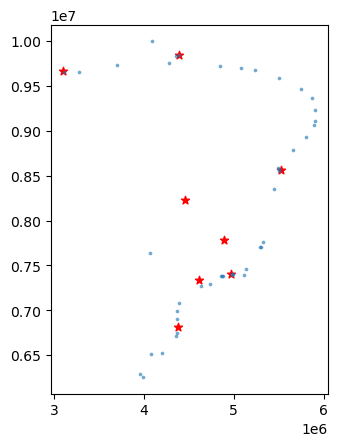

In [369]:
largeAirports=airports[airports.kind=='large_airport']
base=largeAirports.plot(color='red',marker="*")
seaports_bra_5641.plot(ax=base,alpha=0.5,markersize=3)

In [370]:
largeAirports

,name,kind,latitude_deg,longitude_deg,elevation_ft,region_name,municipality,geometry
0,Guarulhos - Governador André Franco Montoro In...,large_airport,-23.431944,-46.467778,2461.0,São Paulo,São Paulo,POINT (4614202.306 7334259.930)
1,Rio Galeão – Tom Jobim International Airport,large_airport,-22.809999,-43.250557,28.0,Rio de Janeiro,Rio De Janeiro,POINT (4972125.000 7409069.810)
4,Presidente Juscelino Kubitschek International ...,large_airport,-15.869167,-47.920834,3497.0,Distrito Federal,Brasília,POINT (4452546.729 8223176.558)
5,Deputado Luiz Eduardo Magalhães International ...,large_airport,-12.908611,-38.322498,64.0,Bahia,Salvador,POINT (5520382.068 8561117.560)
9,Tancredo Neves International Airport,large_airport,-19.635710,-43.966928,2721.0,Minas Gerais,Belo Horizonte,POINT (4892427.199 7785766.984)
12,Eduardo Gomes International Airport,large_airport,-3.038610,-60.049702,264.0,Amazonas,Manaus,POINT (3103184.311 9664051.584)
14,Hercílio Luz International Airport,large_airport,-27.670279,-48.552502,16.0,Santa Catarina,Florianópolis,POINT (4382272.317 6814299.684)
16,Val de Cans/Júlio Cezar Ribeiro International ...,large_airport,-1.379279,-48.476207,54.0,Pará,Belém,POINT (4390760.299 9847564.588)


In [371]:
seaports_bra_5641

,portName,Country Code,Latitude,Longitude,geometry
25,Dtse / Gegua Oil Terminal,Brazil,-22.816667,-43.150000,POINT (4983312.180 7408269.607)
158,Porto De Mucuripe,Brazil,-3.716667,-38.483333,POINT (5502488.831 9588988.711)
171,Portocel,Brazil,-19.850000,-40.050000,POINT (5328193.788 7760588.183)
182,Santa Clara,Brazil,-20.883333,-51.366667,POINT (4069190.463 7638681.573)
258,Aratu,Brazil,-12.783333,-38.500000,POINT (5500634.592 8575321.802)
267,Cabedelo,Brazil,-6.966667,-34.833333,POINT (5908559.111 9228202.479)
558,Imbituba,Brazil,-28.233333,-48.666667,POINT (4369571.218 6743756.623)
559,Angra Dos Reis,Brazil,-23.016667,-44.316667,POINT (4853517.990 7384249.833)
561,Natal,Brazil,-5.783333,-35.200000,POINT (5867766.626 9359796.528)
562,Guamare Oil Terminal,Brazil,-4.866667,-36.283333,POINT (5747243.520 9461540.928)


In [380]:
for positionAir, airport in largeAirports.iterrows():
    print(air['name'])

Guarulhos - Governador André Franco Montoro International Airport
Rio Galeão – Tom Jobim International Airport
Presidente Juscelino Kubitschek International Airport
Deputado Luiz Eduardo Magalhães International Airport
Tancredo Neves International Airport
Eduardo Gomes International Airport
Hercílio Luz International Airport
Val de Cans/Júlio Cezar Ribeiro International Airport


In [400]:
origin=[]
destination=[]
distances=[]
for positionAir, airport in largeAirports.iterrows():
    for positionSea,seaport  in seaports_bra_5641.iterrows():        
        origin.append(seaport.portName)
        destination.append(airport['name'])
        distances.append(seaport.geometry.distance(airport.geometry)) 
allDistances={'origin':origin,'destination':destination,'distances':distances}

In [401]:
allDistancesDF=pd.DataFrame(allDistances)
allDistancesDF

,origin,destination,distances
0,Dtse / Gegua Oil Terminal,Guarulhos - Governador André Franco Montoro In...,3.764565e+05
1,Porto De Mucuripe,Guarulhos - Governador André Franco Montoro In...,2.423397e+06
2,Portocel,Guarulhos - Governador André Franco Montoro In...,8.315886e+05
3,Santa Clara,Guarulhos - Governador André Franco Montoro In...,6.242679e+05
4,Aratu,Guarulhos - Governador André Franco Montoro In...,1.525122e+06
...,...,...,...
355,Vitoria,Val de Cans/Júlio Cezar Ribeiro International ...,2.325626e+06
356,Vila Do Conde,Val de Cans/Júlio Cezar Ribeiro International ...,3.583259e+04
357,Tubarao,Val de Cans/Júlio Cezar Ribeiro International ...,2.325639e+06
358,Paranagua,Val de Cans/Júlio Cezar Ribeiro International ...,2.764697e+06


In [402]:
distanceMatrixDF=pd.pivot(allDistancesDF,index=['origin'], columns = 'destination',values = 'distances') 
distanceMatrixDF

destination,Deputado Luiz Eduardo Magalhães International Airport,Eduardo Gomes International Airport,Guarulhos - Governador André Franco Montoro International Airport,Hercílio Luz International Airport,Presidente Juscelino Kubitschek International Airport,Rio Galeão – Tom Jobim International Airport,Tancredo Neves International Airport,Val de Cans/Júlio Cezar Ribeiro International Airport
origin,,,,,,,,
Angra Dos Reis,1.352673e+06,2.874224e+06,2.444811e+05,7.395375e+05,9.298258e+05,1.211761e+05,4.033980e+05,2.506405e+06
Aratu,2.432536e+04,2.633078e+06,1.525122e+06,2.086129e+06,1.105665e+06,1.280416e+06,9.966509e+05,1.688319e+06
Belem,1.707901e+06,1.296885e+06,2.515667e+06,3.025453e+06,1.617854e+06,2.499852e+06,2.114986e+06,8.253587e+03
Cabedelo,7.718055e+05,2.839030e+06,2.293987e+06,2.855955e+06,1.769194e+06,2.046009e+06,1.764410e+06,1.639306e+06
Cameta,1.721297e+06,1.176915e+06,2.440461e+06,2.938885e+06,1.538183e+06,2.443236e+06,2.059664e+06,1.491345e+05
Camocim,1.152632e+06,2.137917e+06,2.427461e+06,2.991026e+06,1.655986e+06,2.286192e+06,1.925446e+06,8.667578e+05
Dtse / Gegua Oil Terminal,1.271811e+06,2.936568e+06,3.764565e+05,8.450143e+05,9.725149e+05,1.121576e+04,3.882839e+05,2.510235e+06
Gebig,1.350725e+06,2.884184e+06,2.546274e+05,7.436219e+05,9.382752e+05,1.112804e+05,4.064746e+05,2.512417e+06
Guaiba Island Terminal,1.337415e+06,2.893528e+06,2.754120e+05,7.600119e+05,9.438475e+05,9.055338e+04,4.015851e+05,2.512415e+06


In [415]:
distanceMatrixDF.mean(axis=1)

origin
Angra Dos Reis               1.146465e+06
Aratu                        1.417463e+06
Belem                        1.848357e+06
Cabedelo                     1.997462e+06
Cameta                       1.808472e+06
Camocim                      1.930427e+06
Dtse / Gegua Oil Terminal    1.164012e+06
Gebig                        1.150201e+06
Guaiba Island Terminal       1.151846e+06
Guamare Oil Terminal         2.030761e+06
Imbituba                     1.586758e+06
Itacoatiara                  2.079303e+06
Itajai                       1.460947e+06
Itaqui                       1.834562e+06
Laguna                       1.620490e+06
Macae                        1.224615e+06
Madre De Deus                1.412758e+06
Manaus                       2.162971e+06
Natal                        2.043797e+06
Niteroi                      1.169708e+06
Paranagua                    1.349661e+06
Pelotas                      2.123515e+06
Port De Aracaju              1.613079e+06
Port De Salvador           

In [408]:
distanceMatrixDF.idxmax(axis="columns")

origin
Angra Dos Reis                             Eduardo Gomes International Airport
Aratu                                      Eduardo Gomes International Airport
Belem                                       Hercílio Luz International Airport
Cabedelo                                    Hercílio Luz International Airport
Cameta                                      Hercílio Luz International Airport
Camocim                                     Hercílio Luz International Airport
Dtse / Gegua Oil Terminal                  Eduardo Gomes International Airport
Gebig                                      Eduardo Gomes International Airport
Guaiba Island Terminal                     Eduardo Gomes International Airport
Guamare Oil Terminal                        Hercílio Luz International Airport
Imbituba                                   Eduardo Gomes International Airport
Itacoatiara                                 Hercílio Luz International Airport
Itajai                                     Ed

In [409]:
distanceMatrixDF.idxmin(axis="columns")

origin
Angra Dos Reis                    Rio Galeão – Tom Jobim International Airport
Aratu                        Deputado Luiz Eduardo Magalhães International ...
Belem                        Val de Cans/Júlio Cezar Ribeiro International ...
Cabedelo                     Deputado Luiz Eduardo Magalhães International ...
Cameta                       Val de Cans/Júlio Cezar Ribeiro International ...
Camocim                      Val de Cans/Júlio Cezar Ribeiro International ...
Dtse / Gegua Oil Terminal         Rio Galeão – Tom Jobim International Airport
Gebig                             Rio Galeão – Tom Jobim International Airport
Guaiba Island Terminal            Rio Galeão – Tom Jobim International Airport
Guamare Oil Terminal         Deputado Luiz Eduardo Magalhães International ...
Imbituba                                    Hercílio Luz International Airport
Itacoatiara                                Eduardo Gomes International Airport
Itajai                                      H